In [1]:
## import libraries
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import seaborn as sns
import statsmodels.formula.api as smf
from statsmodels.graphics.regressionplots import influence_plot
import numpy as np
import warnings
warnings.filterwarnings('ignore')

In [20]:
from pandas_profiling import ProfileReport

toyo = pd.read_csv('ToyotaCorolla1.csv', encoding='latin')


# Generate the pandas profiling report
profile = ProfileReport(toyo)

# Save the report to an HTML file
profile.to_file("report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [21]:
from IPython.display import display
# Display the report within the notebook
display(profile)

In [10]:
toyo = pd.read_csv('ToyotaCorolla1.csv', encoding='latin')

In [11]:
toyo

,Id,Model,Price,Age_08_04,Mfg_Month,Mfg_Year,KM,Fuel_Type,HP,Met_Color,...,Central_Lock,Powered_Windows,Power_Steering,Radio,Mistlamps,Sport_Model,Backseat_Divider,Metallic_Rim,Radio_cassette,Tow_Bar
0,1,TOYOTA Corolla 2.0 D4D HATCHB TERRA 2/3-Doors,13500,23,10,2002,46986,Diesel,90,1,...,1,1,1,0,0,0,1,0,0,0
1,2,TOYOTA Corolla 2.0 D4D HATCHB TERRA 2/3-Doors,13750,23,10,2002,72937,Diesel,90,1,...,1,0,1,0,0,0,1,0,0,0
2,3,?TOYOTA Corolla 2.0 D4D HATCHB TERRA 2/3-Doors,13950,24,9,2002,41711,Diesel,90,1,...,0,0,1,0,0,0,1,0,0,0
3,4,TOYOTA Corolla 2.0 D4D HATCHB TERRA 2/3-Doors,14950,26,7,2002,48000,Diesel,90,0,...,0,0,1,0,0,0,1,0,0,0
4,5,TOYOTA Corolla 2.0 D4D HATCHB SOL 2/3-Doors,13750,30,3,2002,38500,Diesel,90,0,...,1,1,1,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1431,1438,TOYOTA Corolla 1.3 16V HATCHB G6 2/3-Doors,7500,69,12,1998,20544,Petrol,86,1,...,1,1,1,0,1,1,1,0,0,0
1432,1439,TOYOTA Corolla 1.3 16V HATCHB LINEA TERRA 2/3-...,10845,72,9,1998,19000,Petrol,86,0,...,0,0,1,0,0,1,1,0,0,0
1433,1440,TOYOTA Corolla 1.3 16V HATCHB LINEA TERRA 2/3-...,8500,71,10,1998,17016,Petrol,86,0,...,0,0,1,0,0,0,1,0,0,0
1434,1441,TOYOTA Corolla 1.3 16V HATCHB LINEA TERRA 2/3-...,7250,70,11,1998,16916,Petrol,86,1,...,0,0,0,0,0,0,1,0,0,0


## EDA

In [12]:
toyo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1436 entries, 0 to 1435
Data columns (total 37 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Id                1436 non-null   int64 
 1   Model             1436 non-null   object
 2   Price             1436 non-null   int64 
 3   Age_08_04         1436 non-null   int64 
 4   Mfg_Month         1436 non-null   int64 
 5   Mfg_Year          1436 non-null   int64 
 6   KM                1436 non-null   int64 
 7   Fuel_Type         1436 non-null   object
 8   HP                1436 non-null   int64 
 9   Met_Color         1436 non-null   int64 
 10  Automatic         1436 non-null   int64 
 11  cc                1436 non-null   int64 
 12  Doors             1436 non-null   int64 
 13  Cylinders         1436 non-null   int64 
 14  Gears             1436 non-null   int64 
 15  Quarterly_Tax     1436 non-null   int64 
 16  Weight            1436 non-null   int64 
 17  Mfr_Guarantee 

In [13]:
# Selecting columns
toyo2=pd.concat([toyo.iloc[:,2:4],toyo.iloc[:,6:7],toyo.iloc[:,8:9],toyo.iloc[:,12:14],toyo.iloc[:,15:18]],axis=1)
toyo2

,Price,Age_08_04,KM,HP,Doors,Cylinders,Quarterly_Tax,Weight,Mfr_Guarantee
0,13500,23,46986,90,3,4,210,1165,0
1,13750,23,72937,90,3,4,210,1165,0
2,13950,24,41711,90,3,4,210,1165,1
3,14950,26,48000,90,3,4,210,1165,1
4,13750,30,38500,90,3,4,210,1170,1
...,...,...,...,...,...,...,...,...,...
1431,7500,69,20544,86,3,4,69,1025,1
1432,10845,72,19000,86,3,4,69,1015,0
1433,8500,71,17016,86,3,4,69,1015,0
1434,7250,70,16916,86,3,4,69,1015,1


In [14]:
# Renaming the Columns
toyo3=toyo2.rename({'Age_08_04':'Age','cc':'CC','Quarterly_Tax':'QT'},axis=1)
toyo3

,Price,Age,KM,HP,Doors,Cylinders,QT,Weight,Mfr_Guarantee
0,13500,23,46986,90,3,4,210,1165,0
1,13750,23,72937,90,3,4,210,1165,0
2,13950,24,41711,90,3,4,210,1165,1
3,14950,26,48000,90,3,4,210,1165,1
4,13750,30,38500,90,3,4,210,1170,1
...,...,...,...,...,...,...,...,...,...
1431,7500,69,20544,86,3,4,69,1025,1
1432,10845,72,19000,86,3,4,69,1015,0
1433,8500,71,17016,86,3,4,69,1015,0
1434,7250,70,16916,86,3,4,69,1015,1


In [15]:
#check for missing values
toyo3.isna().sum()

Price            0
Age              0
KM               0
HP               0
Doors            0
Cylinders        0
QT               0
Weight           0
Mfr_Guarantee    0
dtype: int64

In [16]:
toyo3[toyo3.duplicated()]

,Price,Age,KM,HP,Doors,Cylinders,QT,Weight,Mfr_Guarantee
113,24950,8,13253,116,5,4,234,1320,0


In [17]:
toyo4=toyo3.drop_duplicates().reset_index(drop=True)
toyo4

,Price,Age,KM,HP,Doors,Cylinders,QT,Weight,Mfr_Guarantee
0,13500,23,46986,90,3,4,210,1165,0
1,13750,23,72937,90,3,4,210,1165,0
2,13950,24,41711,90,3,4,210,1165,1
3,14950,26,48000,90,3,4,210,1165,1
4,13750,30,38500,90,3,4,210,1170,1
...,...,...,...,...,...,...,...,...,...
1430,7500,69,20544,86,3,4,69,1025,1
1431,10845,72,19000,86,3,4,69,1015,0
1432,8500,71,17016,86,3,4,69,1015,0
1433,7250,70,16916,86,3,4,69,1015,1


In [18]:
toyo4.describe()

,Price,Age,KM,HP,Doors,Cylinders,QT,Weight,Mfr_Guarantee
count,1435.000000,1435.000000,1435.000000,1435.000000,1435.000000,1435.0,1435.000000,1435.000000,1435.000000
mean,10720.915679,55.980488,68571.782578,101.491986,4.032753,4.0,87.020209,1072.287108,0.409756
std,3608.732978,18.563312,37491.094553,14.981408,0.952667,0.0,40.959588,52.251882,0.491960
min,4350.000000,1.000000,1.000000,69.000000,2.000000,4.0,19.000000,1000.000000,0.000000
25%,8450.000000,44.000000,43000.000000,90.000000,3.000000,4.0,69.000000,1040.000000,0.000000
50%,9900.000000,61.000000,63451.000000,110.000000,4.000000,4.0,85.000000,1070.000000,0.000000
75%,11950.000000,70.000000,87041.500000,110.000000,5.000000,4.0,85.000000,1085.000000,1.000000
max,32500.000000,80.000000,243000.000000,192.000000,5.000000,4.0,283.000000,1615.000000,1.000000


## Correlation Analysis

In [19]:
toyo4.corr()

,Price,Age,KM,HP,Doors,Cylinders,QT,Weight,Mfr_Guarantee
Price,1.000000,-0.876273,-0.569420,0.314134,0.183604,NaN,0.211508,0.575869,0.201207
Age,-0.876273,1.000000,0.504575,-0.155293,-0.146929,NaN,-0.193319,-0.466484,-0.166581
KM,-0.569420,0.504575,1.000000,-0.332904,-0.035193,NaN,0.283312,-0.023969,-0.213920
HP,0.314134,-0.155293,-0.332904,1.000000,0.091803,NaN,-0.302287,0.087143,0.140668
Doors,0.183604,-0.146929,-0.035193,0.091803,1.000000,NaN,0.107353,0.301734,0.038301
Cylinders,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
QT,0.211508,-0.193319,0.283312,-0.302287,0.107353,NaN,1.000000,0.621988,-0.020172
Weight,0.575869,-0.466484,-0.023969,0.087143,0.301734,NaN,0.621988,1.000000,-0.005882
Mfr_Guarantee,0.201207,-0.166581,-0.213920,0.140668,0.038301,NaN,-0.020172,-0.005882,1.000000


## Format the plot background and scatter plots for all the variables

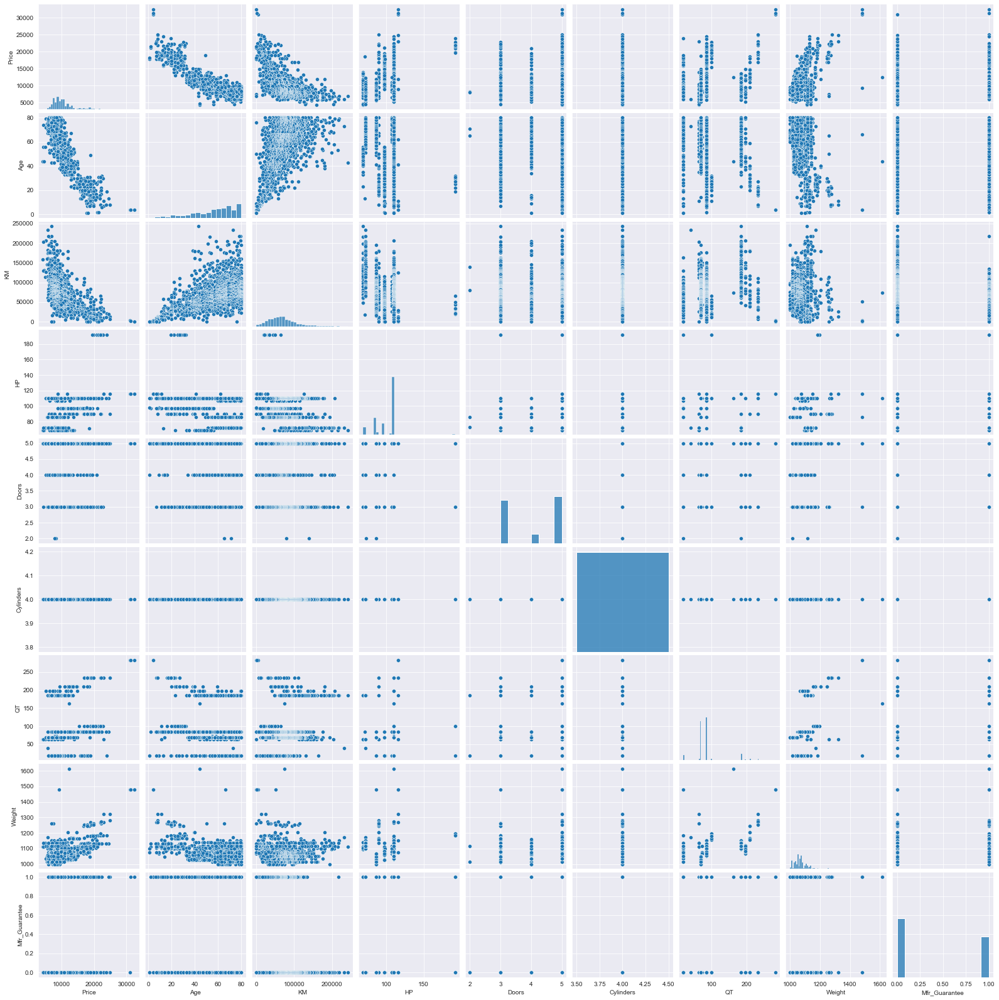

In [28]:
sns.set_style(style='darkgrid')
sns.pairplot(toyo4)

## Preparing a model

In [32]:
#Build model
import statsmodels.formula.api as smf

model = smf.ols('Price ~ Age + KM + HP + Doors + Cylinders + QT + Weight + Mfr_Guarantee', data=toyo4).fit()

In [33]:
#Coefficients
model.params

Intercept       -177.792923
Age             -121.061311
KM                -0.020016
HP                32.188555
Doors            -29.140305
Cylinders       -711.171693
QT                 3.342702
Weight            17.105891
Mfr_Guarantee    269.255238
dtype: float64

In [34]:
#t and p-Values
print(model.tvalues, '\n', np.round(model.pvalues,5))

Intercept        -2.842720
Age             -46.180863
KM              -15.954560
HP               11.758219
Doors            -0.742436
Cylinders        -2.842720
QT                2.561472
Weight           16.106034
Mfr_Guarantee     3.607694
dtype: float64 
 Intercept        0.00454
Age              0.00000
KM               0.00000
HP               0.00000
Doors            0.45795
Cylinders        0.00454
QT               0.01052
Weight           0.00000
Mfr_Guarantee    0.00032
dtype: float64


In [35]:
#R squared values
(model.rsquared,model.rsquared_adj)

(0.8627055437853398, 0.8620320601178537)

In [39]:
#Build SLR and MLR models for 'CC' and 'Doors' and find their t and p values
     
slr_C=smf.ols('Price~Cylinders',data = toyo4).fit()  
#t and p-Values
print(slr_C.tvalues, '\n',slr_C.pvalues) 

Intercept    112.539008
Cylinders    112.539008
dtype: float64 
 Intercept    0.0
Cylinders    0.0
dtype: float64


In [40]:
slr_D=smf.ols('Price~Doors',data = toyo4).fit()  
#t and p-Values
print(slr_D.tvalues, '\n',slr_D.pvalues) 

Intercept    19.421546
Doors         7.070520
dtype: float64 
 Intercept    8.976407e-75
Doors        2.404166e-12
dtype: float64


In [41]:
mlr_CD=smf.ols('Price~Cylinders+Doors',data = toyo4).fit()  
#t and p-Values
print(mlr_CD.tvalues, '\n',mlr_CD.pvalues) 

Intercept    19.421546
Cylinders    19.421546
Doors         7.070520
dtype: float64 
 Intercept    8.976407e-75
Cylinders    8.976407e-75
Doors        2.404166e-12
dtype: float64


In [50]:
import pandas as pd
import statsmodels.formula.api as smf

# Calculate VIF for each variable
variables = ['Price', 'Age', 'KM', 'HP', 'Doors', 'Cylinders',  'QT', 'Weight', 'Mfr_Guarantee']

vif_values = []

for variable in variables:
    formula = f"{variable} ~ {'+'.join(variables)} - {variable}"
    rsq = smf.ols(formula, data=toyo4).fit().rsquared
    vif = 1 / (1 - rsq)
    vif_values.append(vif)

# Create a DataFrame to store the VIF values
d1 = {'Variables': variables, 'VIF': vif_values}
Vif_frame = pd.DataFrame(d1)

print(Vif_frame)

       Variables       VIF
0          Price  7.283615
1            Age  4.714602
2             KM  2.080608
3             HP  1.472475
4          Doors  1.116300
5      Cylinders  0.000000
6             QT  2.290766
7         Weight  2.904807
8  Mfr_Guarantee  1.085758


## Residual Analysis
Test for Normality of Residuals (Q-Q Plot)

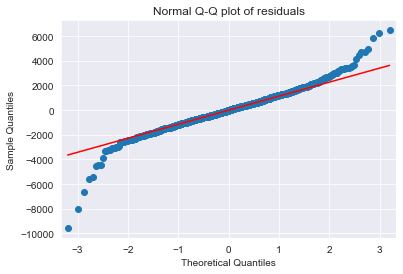

In [51]:
# None of the VIF>20, No collinearity, consider all variables in Regression Equation
qqplot=sm.qqplot(model.resid,line='q')
plt.title("Normal Q-Q plot of residuals")
plt.show()

In [52]:
list(np.where(model.resid>6000))

[array([146, 522], dtype=int64)]

In [53]:
list(np.where(model.resid<-6000))

[array([220, 600, 959], dtype=int64)]

## Residual Plot for Homoscedasticity

In [54]:
def get_standardized_values( vals ):return (vals - vals.mean())/vals.std()

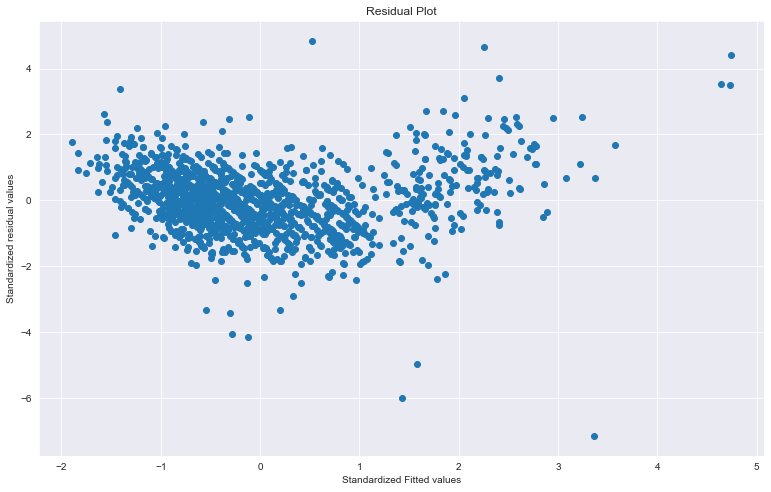

In [55]:
plt.figure(figsize=(13,8))
plt.scatter(get_standardized_values(model.fittedvalues),
            get_standardized_values(model.resid))

plt.title('Residual Plot')
plt.xlabel('Standardized Fitted values')
plt.ylabel('Standardized residual values')
plt.show()

## Residual Vs Regressors

eval_env: 1


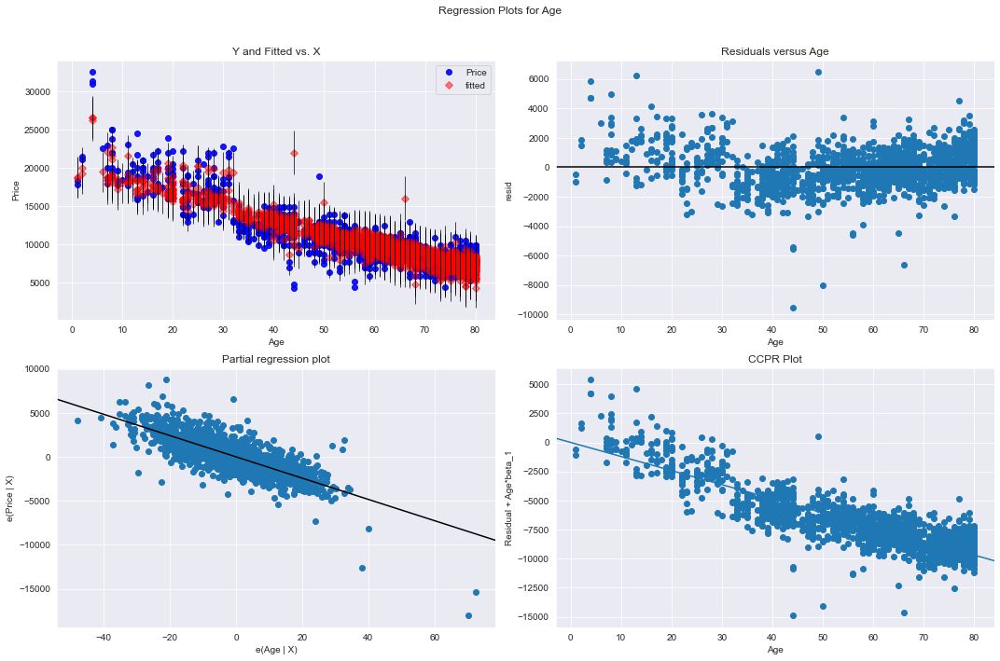

In [56]:
fig = plt.figure(figsize=(15,10))
fig = sm.graphics.plot_regress_exog(model, "Age", fig=fig)
plt.show()

eval_env: 1


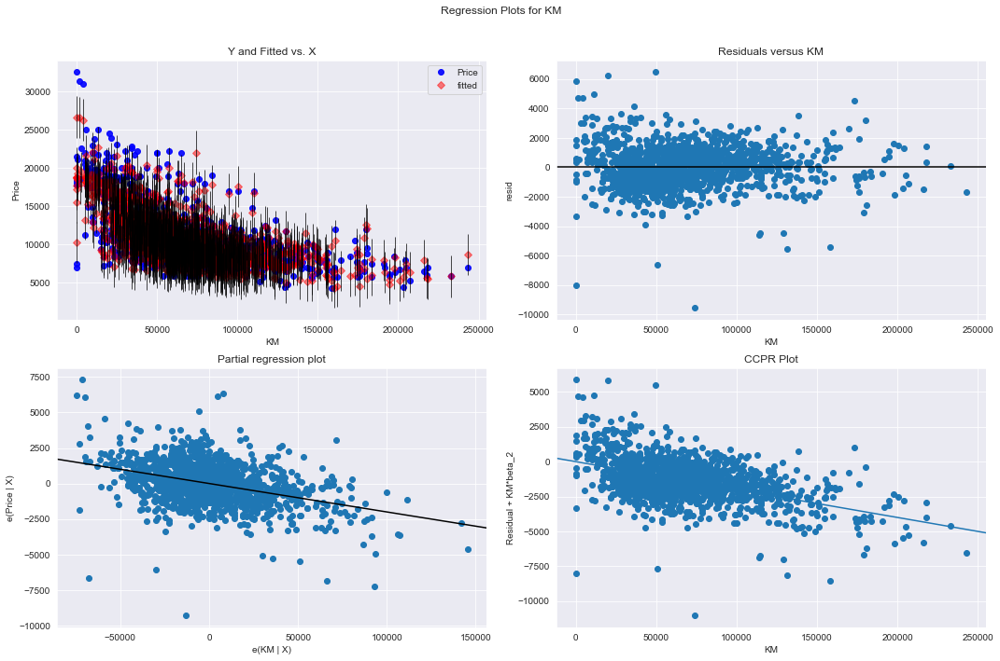

In [57]:
fig = plt.figure(figsize=(15,10))
fig = sm.graphics.plot_regress_exog(model, "KM", fig=fig)
plt.show()

eval_env: 1


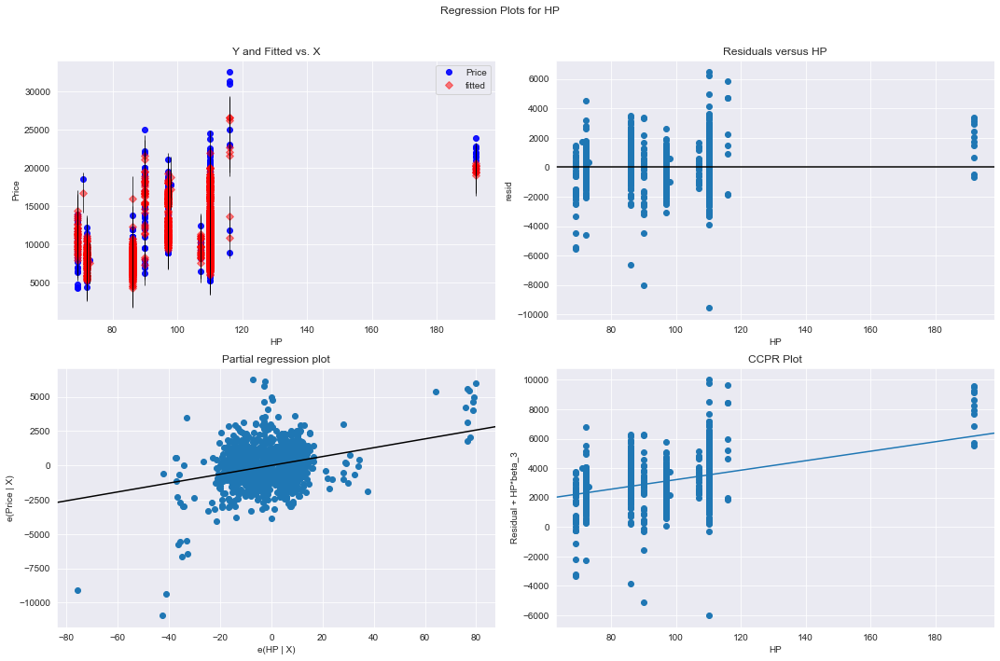

In [58]:
fig = plt.figure(figsize=(15,10))
fig = sm.graphics.plot_regress_exog(model, "HP", fig=fig)
plt.show()

eval_env: 1


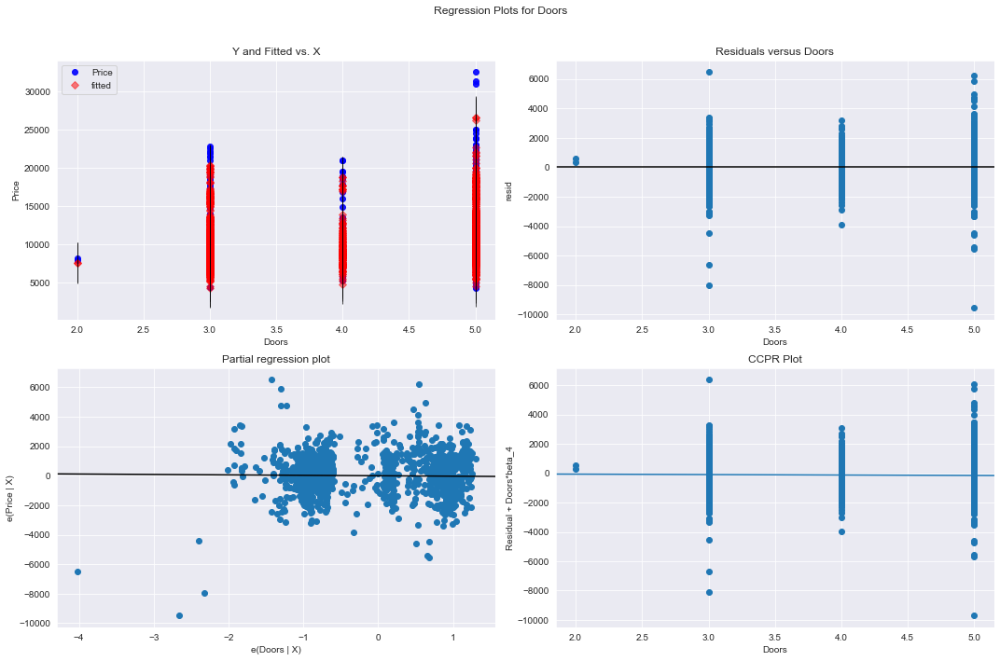

In [60]:
fig = plt.figure(figsize=(15,10))
fig = sm.graphics.plot_regress_exog(model, "Doors", fig=fig)
plt.show()

eval_env: 1


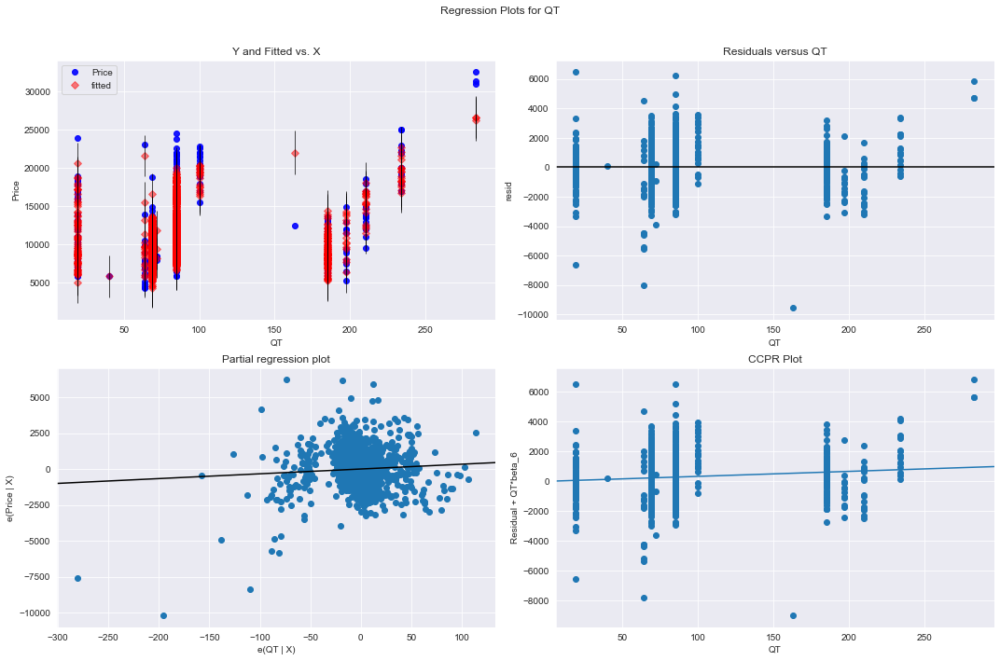

In [62]:
fig = plt.figure(figsize=(15,10))
fig = sm.graphics.plot_regress_exog(model, "QT", fig=fig)
plt.show()

eval_env: 1


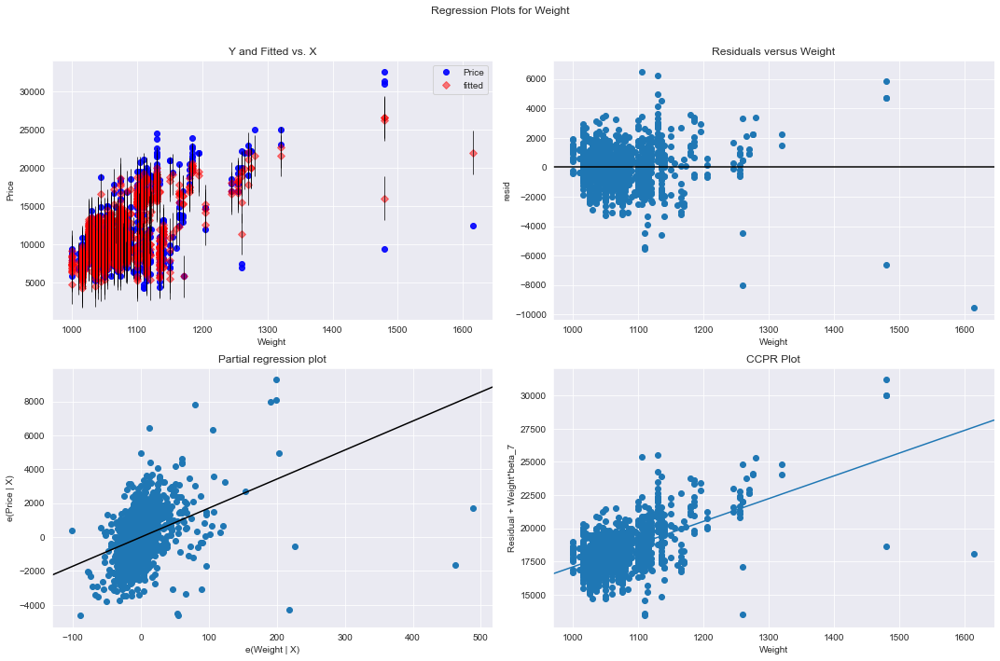

In [63]:
fig = plt.figure(figsize=(15,10))
fig = sm.graphics.plot_regress_exog(model, "Weight", fig=fig)
plt.show()

### Model Deletion Diagnostics (Detecting Influencers/Outliers)Cook’s Distance and Leverage Value

In [64]:
from statsmodels.graphics.regressionplots import influence_plot

model_influence = model.get_influence()
(c, _) = model_influence.cooks_distance    

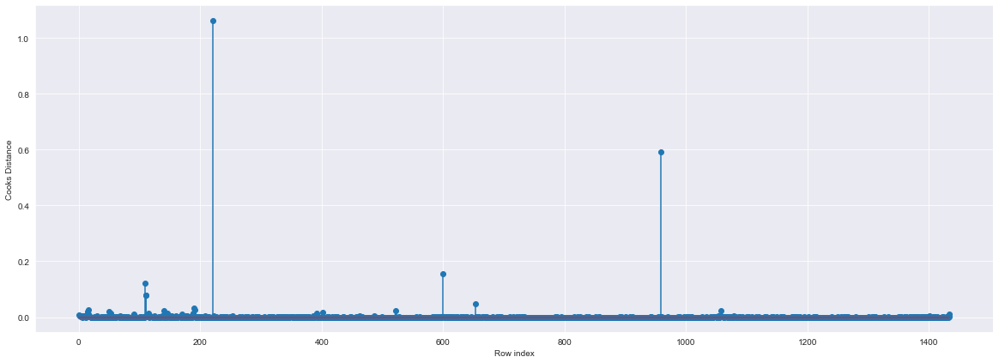

In [65]:
#Plot the influencers values using stem plot
fig = plt.subplots(figsize=(20, 7))
plt.stem(np.arange(len(toyo4)), np.round(c, 3))
plt.xlabel('Row index')
plt.ylabel('Cooks Distance')
plt.show()

In [66]:
#index and value of influencer where c is more than .5
(np.argmax(c),np.max(c))

(220, 1.0640091267584972)

In [67]:
k = toyo4.shape[1]
n = toyo4.shape[0]
leverage_cutoff = 3*((k + 1)/n)
leverage_cutoff

0.020905923344947737

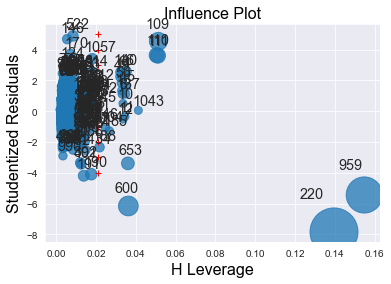

In [68]:
from statsmodels.graphics.regressionplots import influence_plot
import matplotlib.pyplot as plt

influence_plot(model,alhpa=0.5)

y=[i for i in range(-4,6)]
x=[leverage_cutoff for i in range(10)]
plt.plot(x,y,'r+')

plt.show()    

In [69]:
toyo4[toyo4.index.isin([80])]

,Price,Age,KM,HP,Doors,Cylinders,QT,Weight,Mfr_Guarantee
80,18950,25,20019,110,5,4,100,1180,0


In [70]:
#Discard the data points which are influencers and reasign the row number (reset_index())
toyo5 = toyo4.drop(toyo4.index[[80]],axis=0).reset_index(drop=True)
toyo5

,Price,Age,KM,HP,Doors,Cylinders,QT,Weight,Mfr_Guarantee
0,13500,23,46986,90,3,4,210,1165,0
1,13750,23,72937,90,3,4,210,1165,0
2,13950,24,41711,90,3,4,210,1165,1
3,14950,26,48000,90,3,4,210,1165,1
4,13750,30,38500,90,3,4,210,1170,1
...,...,...,...,...,...,...,...,...,...
1429,7500,69,20544,86,3,4,69,1025,1
1430,10845,72,19000,86,3,4,69,1015,0
1431,8500,71,17016,86,3,4,69,1015,0
1432,7250,70,16916,86,3,4,69,1015,1


In [81]:
import statsmodels.formula.api as smf
if np.max(c) > 0.5:
    model = smf.ols('Price~Age+KM+HP+Doors+Cylinders+QT+Weight',data=toyo5).fit()
    (c,_) = model.get_influence().cooks_distance
    c
    np.argmax(c),np.max(c)
    toyo5 = toyo5.drop(toyo5.index[[np.argmax(c)]],axis=0).reset_index(drop=True)
    toyo5
elif np.max(c) < 1:
    final_model = smf.ols('Price~Age+KM+HP+Doors+Cylinders+QT+Weight',data=toyo5).fit()
    final_model.rsquared,final_model.aic
    print('Model accuracy is improved to:',final_model.rsquared)
    print("AIC",final_model.aic)

Model accuracy is improved to: 0.875355051867573
AIC 24534.845785753292


In [76]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Select the columns for VIF calculation
columns = ['Age', 'KM', 'HP', 'Doors', 'Cylinders', 'QT', 'Weight']

# Calculate VIF for each variable
vif_values = pd.DataFrame()
vif_values["Variables"] = columns
vif_values["VIF"] = [variance_inflation_factor(toyo4[columns].values, i) for i in range(len(columns))]

print(vif_values)

   Variables         VIF
0        Age    1.875416
1         KM    1.738917
2         HP    1.325246
3      Doors    1.113939
4  Cylinders  887.295286
5         QT    2.256997
6     Weight    2.423423


In [78]:
toyo5

,Price,Age,KM,HP,Doors,Cylinders,QT,Weight,Mfr_Guarantee
0,13500,23,46986,90,3,4,210,1165,0
1,13750,23,72937,90,3,4,210,1165,0
2,13950,24,41711,90,3,4,210,1165,1
3,14950,26,48000,90,3,4,210,1165,1
4,13750,30,38500,90,3,4,210,1170,1
...,...,...,...,...,...,...,...,...,...
1426,7500,69,20544,86,3,4,69,1025,1
1427,10845,72,19000,86,3,4,69,1015,0
1428,8500,71,17016,86,3,4,69,1015,0
1429,7250,70,16916,86,3,4,69,1015,1


## Model Prediction

In [82]:
predict_y = final_model.predict(toyo5)
predict_y

0       16812.718139
1       16249.301119
2       16813.030388
3       16448.066692
4       16322.005992
            ...     
1426     8869.434855
1427     8311.248426
1428     8468.534888
1429     8584.918199
1430    11261.545534
Length: 1431, dtype: float64

In [83]:
final_model.rsquared #It is a measure of how well the regression model fits the observed data

0.875355051867573

In [85]:
# AIC stands for Akaike Information Criterion. 
#It is a measure of the relative quality of a statistical model for a given set of data.
final_model.aic

24534.845785753292